<a href="https://colab.research.google.com/github/VihaShahh/Exploratory-Data-Analysis-on-Dataset---Terrorism-/blob/main/travel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Exploratory Data Analysis on Dataset - Terrorism**

In [ ]:
# Importing all the important Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
%matplotlib inline
import plotly.express as px
import plotly.graph_objects as go
from collections import Counter

import warnings
warnings.filterwarnings('ignore')

In [ ]:
# Connecting Google Drive with Google Colab
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd

# Specify the encoding as 'ISO-8859-1' (Latin-1) or other appropriate encoding
dataset = pd.read_csv('/content/tourist.csv', encoding='ISO-8859-1', delimiter=',')



# Alternatively, you can try different encodings such as 'latin1', 'cp1252', etc.
# dataset = pd.read_csv('/content/tourist.csv', encoding='latin1')

dataset.head(10)


,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,1.970000e+11,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0.0,0.0,0.0,0.0,NaN
1,1.970000e+11,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0.0,1.0,1.0,1.0,NaN
2,1.970010e+11,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9.0,-9.0,1.0,1.0,NaN
3,1.970010e+11,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9.0,-9.0,1.0,1.0,NaN
4,1.970010e+11,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9.0,-9.0,1.0,1.0,NaN
5,1.970010e+11,1970,1,1,NaN,0,NaN,217,United States,1,...,"The Cairo Chief of Police, William Petersen, r...","""Police Chief Quits,"" Washington Post, January...","""Cairo Police Chief Quits; Decries Local 'Mili...","Christopher Hewitt, ""Political Violence and Te...",Hewitt Project,-9.0,-9.0,0.0,-9.0,NaN
6,1.970010e+11,1970,1,2,NaN,0,NaN,218,Uruguay,3,...,NaN,NaN,NaN,NaN,PGIS,0.0,0.0,0.0,0.0,NaN
7,1.970010e+11,1970,1,2,NaN,0,NaN,217,United States,1,...,"Damages were estimated to be between $20,000-$...",Committee on Government Operations United Stat...,"Christopher Hewitt, ""Political Violence and Te...",NaN,Hewitt Project,-9.0,-9.0,0.0,-9.0,NaN
8,1.970010e+11,1970,1,2,NaN,0,NaN,217,United States,1,...,The New Years Gang issue a communiqué to a loc...,"Tom Bates, ""Rads: The 1970 Bombing of the Army...","David Newman, Sandra Sutherland, and Jon Stewa...","The Wisconsin Cartographers' Guild, ""Wisconsin...",Hewitt Project,0.0,0.0,0.0,0.0,NaN
9,1.970010e+11,1970,1,3,NaN,0,NaN,217,United States,1,...,"Karl Armstrong's girlfriend, Lynn Schultz, dro...",Committee on Government Operations United Stat...,"Tom Bates, ""Rads: The 1970 Bombing of the Army...","David Newman, Sandra Sutherland, and Jon Stewa...",Hewitt Project,0.0,0.0,0.0,0.0,NaN


In [ ]:
dataset.sample(10)

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
103842,2.011110e+11,2011,11,7,NaN,0,NaN,153,Pakistan,6,...,NaN,"""Militants fire six rockets at Kalaya,"" Daily ...",NaN,NaN,START Primary Collection,-9.0,-9.0,0.0,-9.0,NaN
51828,1.992060e+11,1992,6,15,NaN,0,NaN,183,South Africa,11,...,NaN,NaN,NaN,NaN,PGIS,-9.0,-9.0,0.0,-9.0,NaN
132486,2.014050e+11,2014,5,26,NaN,0,NaN,60,Egypt,10,...,There is doubt that this incident meets terror...,"""Egypt elections: 'Bomb explodes at polling st...","""Egypt police deny bomb blast outside polling ...","""Explosion at Egyptian Polling Place,"" Israel ...",START Primary Collection,-9.0,-9.0,0.0,-9.0,NaN
117232,2.013050e+11,2013,5,18,NaN,0,NaN,95,Iraq,10,...,NaN,"""Gunmen Kill Iraqi Police Officer and Family,""...","""At least 16 killed, police abducted during wa...",NaN,START Primary Collection,-9.0,-9.0,0.0,-9.0,NaN
52990,1.992090e+11,1992,9,13,NaN,0,NaN,209,Turkey,10,...,NaN,NaN,NaN,NaN,PGIS,0.0,0.0,0.0,0.0,NaN
62901,1.996070e+11,1996,7,20,NaN,0,NaN,44,China,4,...,NaN,NaN,NaN,NaN,PGIS,0.0,0.0,0.0,0.0,"199607200040, 199607200009, 199607200010, 1996..."
105476,2.012010e+11,2012,1,30,NaN,0,NaN,160,Philippines,5,...,NaN,"""S. Philippine town councilor shot dead, 2 oth...",NaN,NaN,START Primary Collection,-9.0,-9.0,0.0,-9.0,NaN
81400,2.006080e+11,2006,8,26,NaN,0,NaN,19,Bangladesh,6,...,NaN,Leftist Extremists Reportedly Kill 4 Policeme...,NaN,NaN,CETIS,0.0,0.0,0.0,0.0,NaN
70190,2.000030e+11,2000,3,17,NaN,0,NaN,213,Uganda,11,...,NaN,"Anna Borzello, Uganda Inquiry into Cult Death...","John Thawite, Kanungu Acid Stolen From Kasese...","Michael Dynes and David Lister, Cultists Rel...",CETIS,-9.0,-9.0,0.0,-9.0,NaN
64108,1.996120e+11,1996,12,5,NaN,0,NaN,603,United Kingdom,8,...,NaN,NaN,NaN,NaN,PGIS,-9.0,-9.0,1.0,1.0,NaN


In [ ]:
dataset.shape

(162437, 135)

In [ ]:
dataset.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)

In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 162437 entries, 0 to 162436
Columns: 135 entries, eventid to related
dtypes: float64(63), int64(14), object(58)
memory usage: 167.3+ MB


In [ ]:
dataset.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.624370e+05,162437.000000,162437.000000,162437.000000,162437.000000,162437.000000,162437.000000,157966.000000,1.579650e+05,162431.000000,...,1.239000e+03,4.530000e+02,6.640000e+02,442.000000,9264.00000,8673.000000,162436.000000,162436.000000,162436.000000,162436.000000
mean,2.001052e+11,2000.988186,6.368057,15.430592,0.042780,132.741106,7.022126,23.277872,-5.205210e+02,1.449403,...,3.419087e+06,7.189358e+05,8.329970e+05,277.576923,4.59402,-27.550675,-4.587554,-4.518814,0.093224,-3.969422
std,1.307215e+09,13.073124,3.408185,8.811879,0.202361,113.199269,2.960147,19.058318,2.168482e+05,1.009753,...,3.152205e+07,7.885910e+06,1.094880e+07,3251.930525,2.04537,65.492591,4.543327,4.627060,0.595286,4.690462
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.00000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.989110e+11,1989.000000,3.000000,8.000000,0.000000,74.000000,5.000000,11.016667,-1.400410e-01,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.00000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.006080e+11,2006.000000,6.000000,15.000000,0.000000,99.000000,6.000000,31.346964,4.253639e+01,1.000000,...,1.420000e+04,0.000000e+00,0.000000e+00,0.000000,4.00000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.013100e+11,2013.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.792160,6.841667e+01,1.000000,...,4.360000e+05,0.000000e+00,4.176620e+03,0.000000,7.00000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.016050e+11,2016.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.00000,2769.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
dataset.isnull().sum()

eventid            0
iyear              0
imonth             0
iday               0
approxdate    156640
               ...  
INT_LOG            1
INT_IDEO           1
INT_MISC           1
INT_ANY            1
related       140905
Length: 135, dtype: int64

In [ ]:
#Rename the necessary columns

dataset.rename(columns={'iyear':'Year','imonth':'Month','city':'City','iday':'Day','country_txt':'Country','region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed','nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type','weaptype1_txt':'Weapon_type','motive':'Motive'},inplace=True)
dataset['Casualities'] = dataset.Killed + dataset.Wounded
dataset=dataset[['Year','Month','Day','Country','Region','City','latitude','longitude','AttackType','Killed','Wounded','Casualities','Target','Group','Target_type','Weapon_type']]
dataset.head(10)

,Year,Month,Day,Country,Region,City,latitude,longitude,AttackType,Killed,Wounded,Casualities,Target,Group,Target_type,Weapon_type
0,1970,7,2,Dominican Republic,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,1.0,Julio Guzman,MANO-D,Private Citizens & Property,Unknown
1,1970,0,0,Mexico,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,0.0,"Nadine Chaval, daughter",23rd of September Communist League,Government (Diplomatic),Unknown
2,1970,1,0,Philippines,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,1.0,Employee,Unknown,Journalists & Media,Unknown
3,1970,1,0,Greece,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,NaN,U.S. Embassy,Unknown,Government (Diplomatic),Explosives
4,1970,1,0,Japan,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,NaN,U.S. Consulate,Unknown,Government (Diplomatic),Incendiary
5,1970,1,1,United States,North America,Cairo,37.005105,-89.176269,Armed Assault,0.0,0.0,0.0,Cairo Police Headquarters,Black Nationalists,Police,Firearms
6,1970,1,2,Uruguay,South America,Montevideo,-34.891151,-56.187214,Assassination,0.0,0.0,0.0,Juan Maria de Lucah/Chief of Directorate of in...,Tupamaros (Uruguay),Police,Firearms
7,1970,1,2,United States,North America,Oakland,37.791927,-122.225906,Bombing/Explosion,0.0,0.0,0.0,Edes Substation,Unknown,Utilities,Explosives
8,1970,1,2,United States,North America,Madison,43.076592,-89.412488,Facility/Infrastructure Attack,0.0,0.0,0.0,"R.O.T.C. offices at University of Wisconsin, M...",New Year's Gang,Military,Incendiary
9,1970,1,3,United States,North America,Madison,43.072950,-89.386694,Facility/Infrastructure Attack,0.0,0.0,0.0,Selective Service Headquarters in Madison Wisc...,New Year's Gang,Government (General),Incendiary


In [ ]:
dataset.sample(10)

,Year,Month,Day,Country,Region,City,latitude,longitude,AttackType,Killed,Wounded,Casualities,Target,Group,Target_type,Weapon_type
115508,2013,3,28,Syria,Middle East & North Africa,Damascus,33.515244,36.292084,Bombing/Explosion,0.0,0.0,0.0,Hotels,Unknown,Business,Explosives
28522,1986,6,29,Peru,South America,Comas District,-11.722374,-75.082651,Bombing/Explosion,0.0,0.0,0.0,Bank,Unknown,Business,Explosives
11912,1980,9,21,Philippines,Southeast Asia,Cotabato City,7.209594,124.241966,Bombing/Explosion,1.0,13.0,14.0,Downtown Plaza,Unknown,Private Citizens & Property,Explosives
80277,2006,4,3,United Kingdom,Western Europe,Edmonton,51.504387,-0.140041,Facility/Infrastructure Attack,0.0,0.0,0.0,Turkish Bank branch in London,Unknown,Business,Incendiary
20019,1983,10,16,Peru,South America,Lima,-11.967368,-76.978462,Bombing/Explosion,NaN,NaN,NaN,"Branch, Philips Corporation",Shining Path (SL),Business,Explosives
123554,2013,11,17,France,Western Europe,Itxassou,43.330475,-1.406904,Facility/Infrastructure Attack,0.0,0.0,0.0,House,Unknown,Private Citizens & Property,Incendiary
109027,2012,6,29,Russia,Eastern Europe,Psedakh,43.465334,44.569526,Armed Assault,1.0,0.0,1.0,District Inspector,Unknown,Police,Firearms
11838,1980,9,12,Portugal,Western Europe,Lisbon,38.725299,-9.150036,Bombing/Explosion,0.0,NaN,NaN,"Office Building, one floor occupied by Chilean...",Unknown,Government (Diplomatic),Explosives
15765,1982,3,21,Peru,South America,Cachi-Cachi,-15.833333,-72.034167,Armed Assault,NaN,NaN,NaN,microwave town of National Telecommunications ...,Shining Path (SL),Telecommunication,Firearms
31164,1987,6,3,India,South Asia,Amritsar,31.633078,74.878288,Assassination,6.0,0.0,6.0,Hindu Worshippers,Sikh Extremists,Religious Figures/Institutions,Firearms


In [ ]:
dataset.shape

(162437, 16)

In [ ]:
dataset.columns

Index(['Year', 'Month', 'Day', 'Country', 'Region', 'City', 'latitude',
       'longitude', 'AttackType', 'Killed', 'Wounded', 'Casualities', 'Target',
       'Group', 'Target_type', 'Weapon_type'],
      dtype='object')

In [ ]:
dataset.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 162437 entries, 0 to 162436
Data columns (total 16 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Year         162437 non-null  int64  
 1   Month        162437 non-null  int64  
 2   Day          162437 non-null  int64  
 3   Country      162437 non-null  object 
 4   Region       162437 non-null  object 
 5   City         162003 non-null  object 
 6   latitude     157966 non-null  float64
 7   longitude    157965 non-null  float64
 8   AttackType   162437 non-null  object 
 9   Killed       153236 non-null  float64
 10  Wounded      147804 non-null  float64
 11  Casualities  147361 non-null  float64
 12  Target       161800 non-null  object 
 13  Group        162436 non-null  object 
 14  Target_type  162437 non-null  object 
 15  Weapon_type  162436 non-null  object 
dtypes: float64(5), int64(3), object(8)
memory usage: 19.8+ MB


In [ ]:
dataset.describe()

,Year,Month,Day,latitude,longitude,Killed,Wounded,Casualities
count,162437.000000,162437.000000,162437.000000,157966.000000,1.579650e+05,153236.000000,147804.000000,147361.000000
mean,2000.988186,6.368057,15.430592,23.277872,-5.205210e+02,2.373711,3.215874,5.311901
std,13.073124,3.408185,8.811879,19.058318,2.168482e+05,11.640137,37.746903,43.984520
min,1970.000000,0.000000,0.000000,-53.154613,-8.618590e+07,0.000000,0.000000,0.000000
25%,1989.000000,3.000000,8.000000,11.016667,-1.400410e-01,0.000000,0.000000,0.000000
50%,2006.000000,6.000000,15.000000,31.346964,4.253639e+01,0.000000,0.000000,1.000000
75%,2013.000000,9.000000,23.000000,34.792160,6.841667e+01,2.000000,2.000000,4.000000
max,2016.000000,12.000000,31.000000,74.633553,1.793667e+02,1570.000000,8191.000000,9574.000000


In [ ]:
#Checking for Missing data:

dataset.isnull().sum()

Year               0
Month              0
Day                0
Country            0
Region             0
City             434
latitude        4471
longitude       4472
AttackType         0
Killed          9201
Wounded        14633
Casualities    15076
Target           637
Group              1
Target_type        0
Weapon_type        1
dtype: int64

In [ ]:
#Removing the Missing data:
dataset.dropna(axis=0, inplace=True)
dataset.shape

(142565, 16)

In [ ]:
#Re-Checking for Missing Data:
dataset.isnull().sum()

Year           0
Month          0
Day            0
Country        0
Region         0
City           0
latitude       0
longitude      0
AttackType     0
Killed         0
Wounded        0
Casualities    0
Target         0
Group          0
Target_type    0
Weapon_type    0
dtype: int64

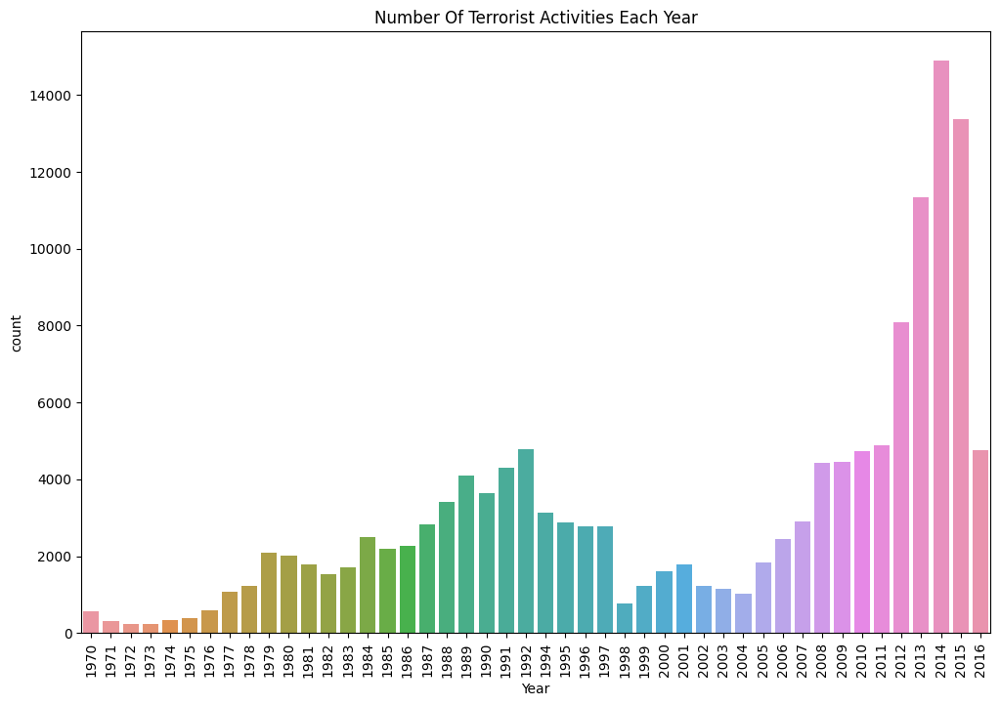

In [ ]:
#Yearly Count of Terrorist Attack-

plt.figure(figsize=(12,8))
sns.countplot(x="Year", data=dataset)
plt.xticks(rotation=90)
plt.title('Number Of Terrorist Activities Each Year')
plt.show()

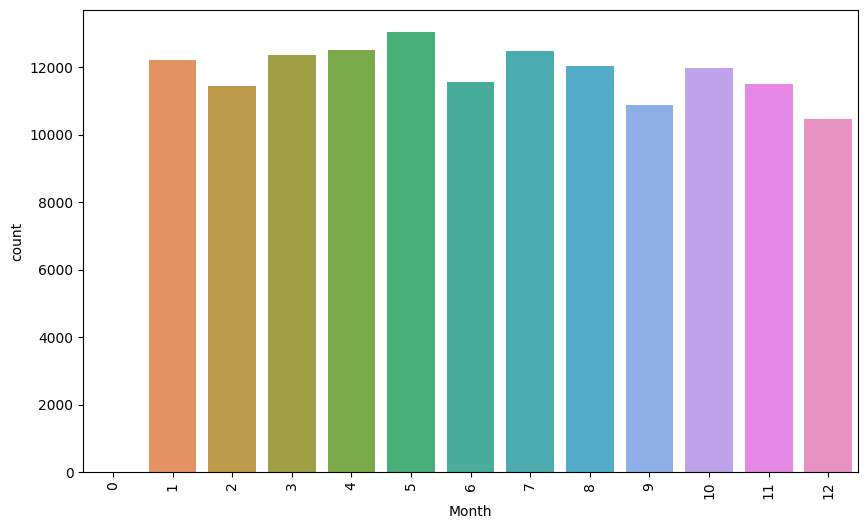

In [ ]:
#month analysis
dataset['Month'].value_counts()
plt.figure(figsize = (10, 6))
sns.countplot(x='Month', data = dataset)
plt.xticks(rotation=90)
plt.show()

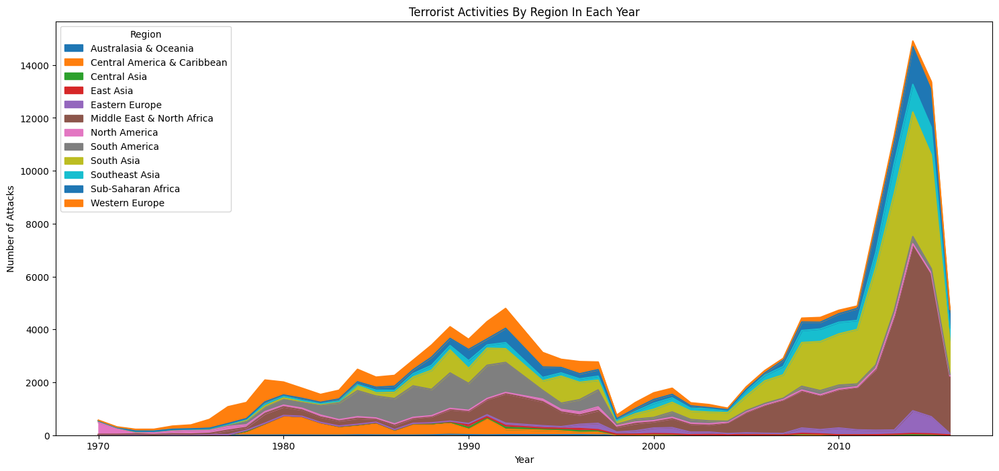

In [ ]:
#Terrorist Activities By Region In Each Year
pd.crosstab(dataset.Year, dataset.Region).plot(kind='area',figsize=(18,8))
plt.title('Terrorist Activities By Region In Each Year')
plt.ylabel('Number of Attacks')
plt.show()


In [ ]:
dataset['Wounded'] = dataset['Wounded'].fillna(0).astype(int)
dataset['Killed'] = dataset['Killed'].fillna(0).astype(int)
dataset['casualities'] = dataset['Killed'] + dataset['Wounded']

In [ ]:
terror1 = dataset.sort_values(by='casualities',ascending=False)[:40]

In [ ]:
heat=terror1.pivot_table(index='Country',columns='Year',values='casualities')
heat.fillna(0,inplace=True)

In [ ]:
heat.head(10)

Year,1982,1984,1987,1992,1994,1995,1996,1997,1998,2001,...,2005,2006,2007,2008,2009,2012,2013,2014,2015,2016
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,536.0,0.0
Algeria,0.0,0.0,0.0,0.0,0.0,0.0,0.0,450.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Chad,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,1161.0,0.0,0.0,0.0,0.0,0.0,0.0
Ethiopia,0.0,0.0,0.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
India,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1005.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Iran,760.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Iraq,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,702.0,462.0,833.333333,0.0,509.0,0.0,0.0,670.0,0.0,1503.0
Japan,0.0,0.0,0.0,0.0,507.0,3092.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Kenya,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4224.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


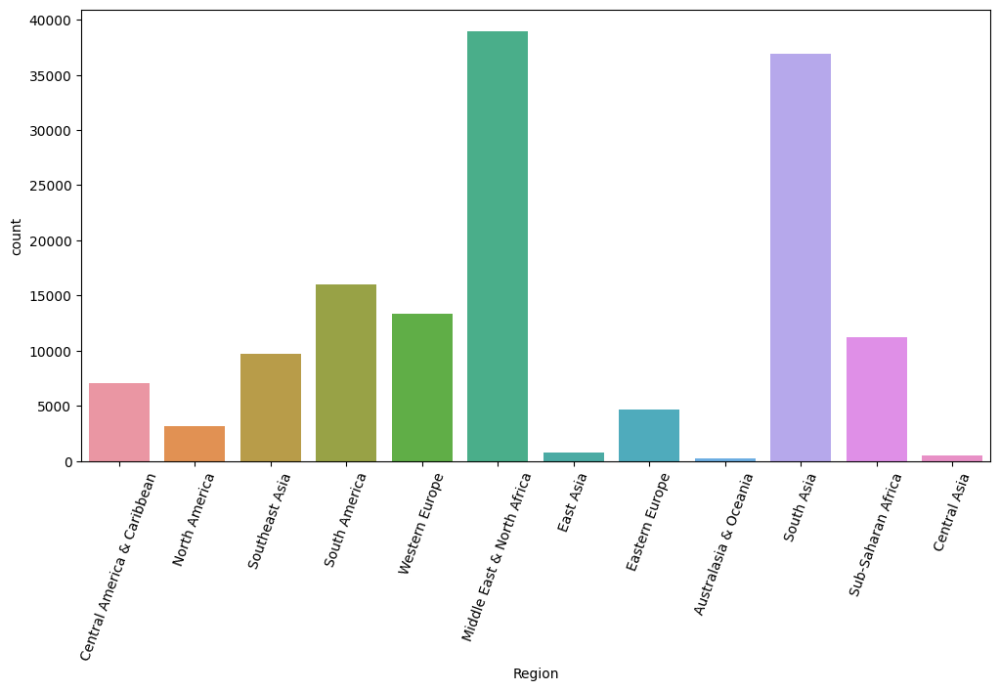

In [ ]:
#REGION AFFECTED BY TERRORIST ATTACK
dataset['Region'].value_counts()
plt.figure(figsize=(12,6
                   ))
sns.countplot(x='Region',data=dataset)
plt.xticks(rotation=70)
plt.show()




In [ ]:
# Observation
# Private Citizens and Property Counts the highest amongst all.

# Analysing the Type of Attacks:-
#Counting the Casuallities according the Attack Type
AttackType=dataset.pivot_table(columns='AttackType',values='Casualities',aggfunc='sum')
AttackType = AttackType.T
AttackType['Type'] = AttackType.index

Text(0.5, 1.0, 'Favorite Targets')

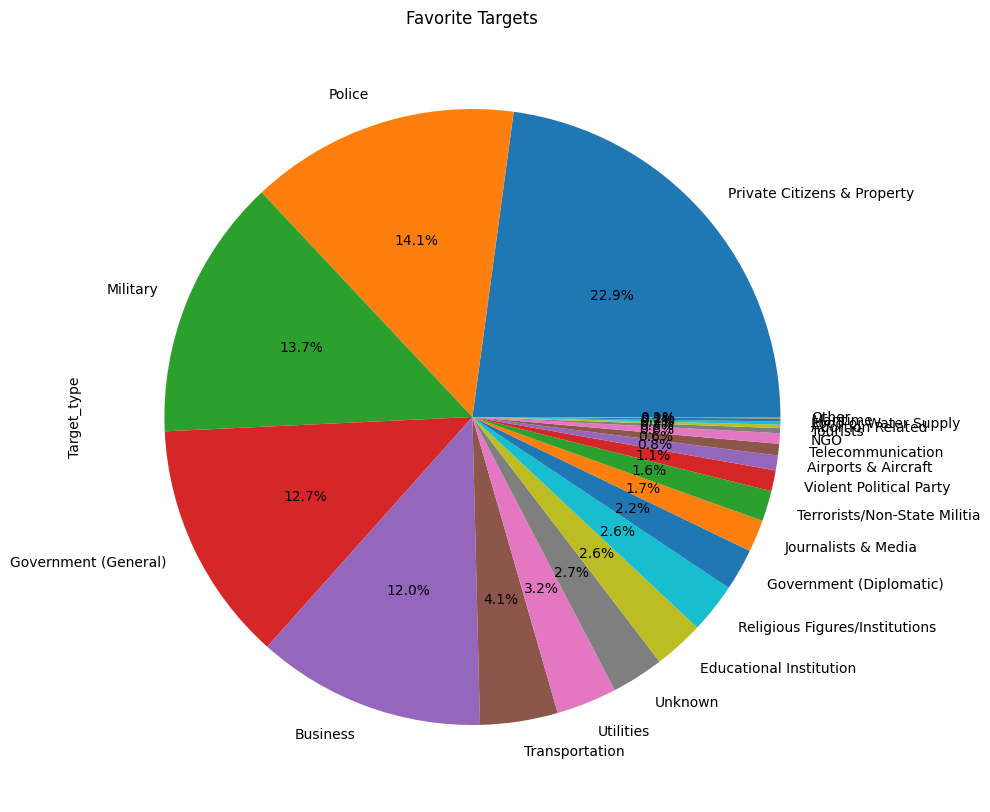

In [ ]:
dataset['Target_type'].value_counts().plot(kind='pie',figsize=[12,10],autopct='%1.1f%%')
plt.title('Favorite Targets')

<Axes: ylabel='Weapon_type'>

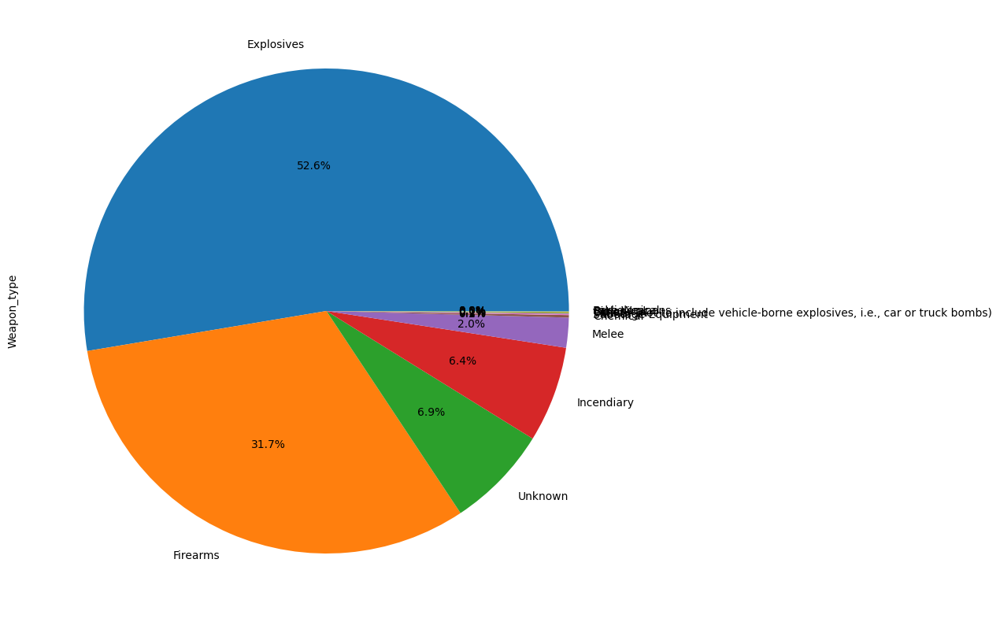

In [ ]:
dataset['Weapon_type'].value_counts().plot(kind='pie',figsize=[15,10],autopct='%1.1f%%')

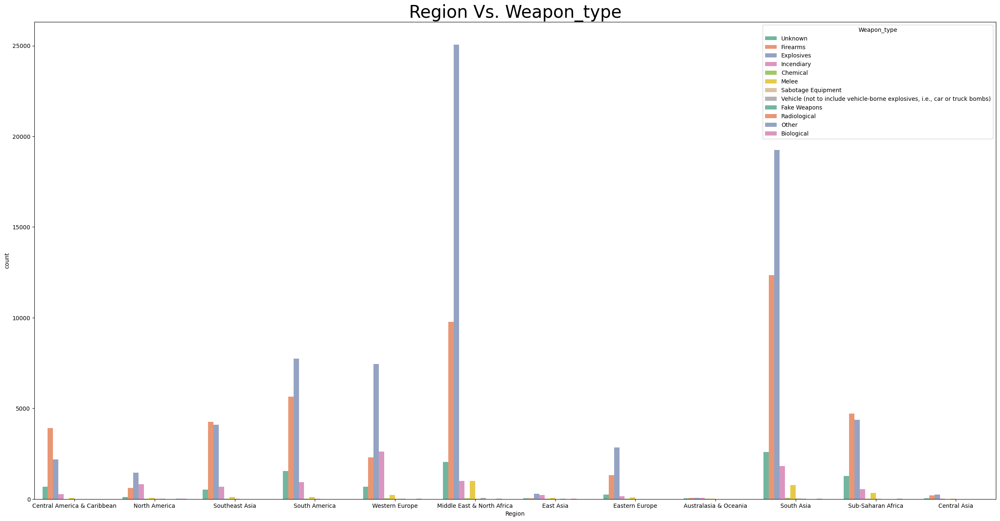

In [ ]:
plt.subplots(figsize = (30,15))
sns.countplot(x="Region", hue ='Weapon_type', data = dataset,palette = "Set2")
plt.title('Region Vs. Weapon_type', fontsize = 30)
plt.show()

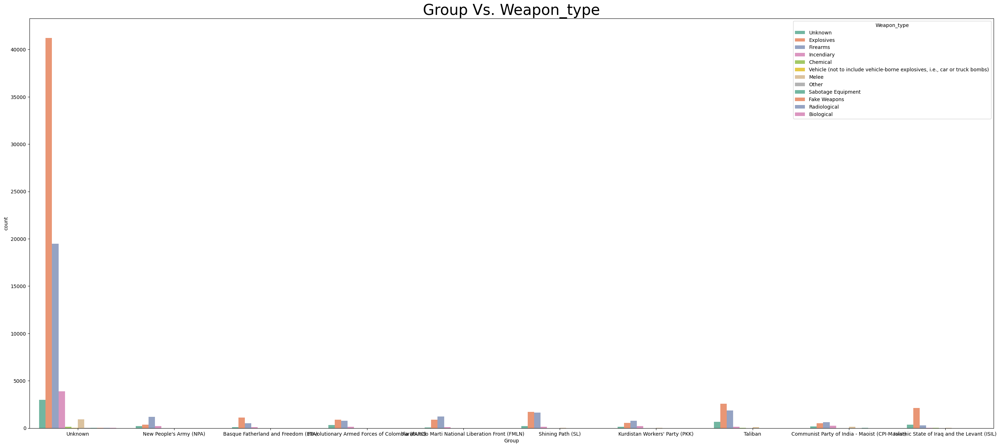

In [ ]:
plt.subplots(figsize = (35,15))
Top_10_Group = dataset['Group'].value_counts().index.tolist()[0:10]
snap = dataset[['Group','Weapon_type']]
AttackG_Weapon = snap[snap['Group'].isin(Top_10_Group)]
sns.countplot(x='Group', hue ='Weapon_type', data = AttackG_Weapon,palette = "Set2")
plt.title('Group Vs. Weapon_type', fontsize = 30)
plt.show()

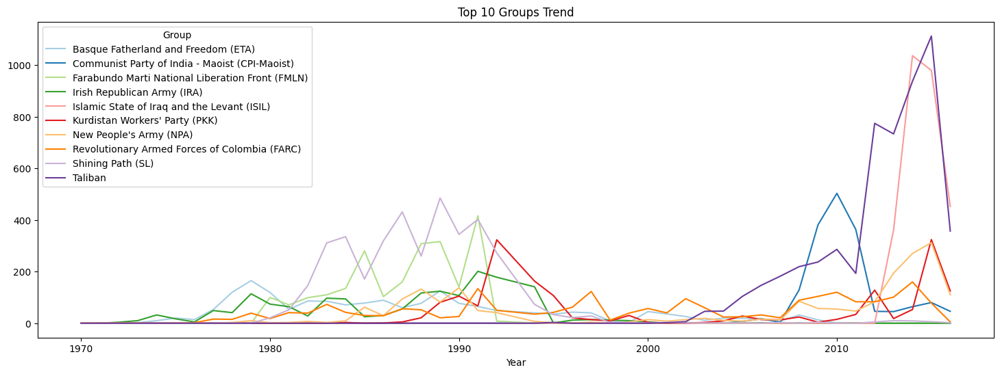

In [ ]:
top_groups10=dataset[dataset['Group'].isin(dataset['Group'].value_counts()[1:11].index)]
pd.crosstab(top_groups10.Year,top_groups10.Group).plot(color=sns.color_palette('Paired',15))
fig=plt.gcf()
fig.set_size_inches(18,6)
plt.title("Top 10 Groups Trend")
plt.show()

In [ ]:
pip install folium

In [ ]:
# Observation
# Again, Bombing and Explosion shows the highest.

# Plotting the HOT-ZONE of Terrorism on the highest year of Terrorist Attack i.e. 2014.
import folium
from folium.plugins import MarkerCluster
year=dataset[dataset['Year']==2014]
mapData=year.loc[:,'City':'longitude']
mapData=mapData.dropna().values.tolist()

map = folium.Map(location = [0, 50], tiles='CartoDB positron', zoom_start=2)
markerCluster = folium.plugins.MarkerCluster().add_to(map)
for point in range(0, len(mapData)):
    folium.Marker(location=[mapData[point][1],mapData[point][2]],
                  popup = mapData[point][0]).add_to(markerCluster)
map